# Metadata

```
Cours:   DS 5001
Module:  07 Lab
Topic:   PCA
Author:  R.C. Alvarado

Purpose: To implement PCA from scratch using eigendecomposition of the term covariance matrix and explore its application to Austen-Melville corpus
```

# Set Up

In [1]:
import pandas as pd
import numpy as np
from scipy.linalg import norm

In [2]:
import plotly.express as px
import seaborn as sns; sns.set()
import os

In [3]:
norm_docs = True # L2 norming
center_by_mean = True 
center_by_variance = False # Not supposed to ... Exaggerates significance of rare words
n_terms = 1000 # Number of significant words; feature space
k = 6 # Number of components

In [4]:
home_dir = os.getcwd()
home_dir

'/Users/mackenzyeleroy/Documents/MSDS/DS5001/FinalProject'

In [5]:
data_home = f"{home_dir}/Data"
parser_lib = f"{home_dir}/lib"
source_files = f'{data_home}/HGWellsAndJulesVerne'
data_prefix = 'wells-verne'

In [6]:
OHCO = ['book_id', 'chap_id']

# Prepare the Data

## Read in files

In [7]:
BOW = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW.csv").set_index(OHCO+['term_str'])
VOCAB = pd.read_csv(f'{data_home}/output/{data_prefix}-VOCAB2.csv').set_index('term_str')
LIB = pd.read_csv(f'{data_home}/output/{data_prefix}-LIB.csv').set_index('book_id')

## `LIB`

In [8]:
LIB.title = LIB.title.apply(lambda x: x[:45])
LIB

,source_file_path,title,author,chap_regex,book_len,n_chaps
book_id,,,,,,
35,WELLS__35__The_Time_Machine.txt,The Time Machine,"WELLS, H.G",^\s*CHAPTER\s+[[IVXLCM]+\.,32506,17
44278,VERNE__44278__From_the_Earth_to_the_Moon.txt,From the Earth to the Moon,"VERNE, JULES",^\s*CHAPTER\s+[IVXLCM]+\.,40559,28
1355,VERNE__1355__The_Underground_City.txt,The Underground City,"VERNE, JULES",^\s*CHAPTER\s+[IVXLCM]+\.,43662,19
159,WELLS__159__The_Island_of_Doctor_Moreau.txt,The Island of Doctor Moreau,"WELLS, H.G",(INTRODUCTION.)|^\s*CHAPTER\s+[IVXLCM]+\.,43782,23
5230,WELLS__5230__The_Invisible_Man_A_Grotesque_Rom...,The Invisible Man A Grotesque Romance,"WELLS, H.G",^\s*CHAPTER\s+[IVXLCM]+\.,48562,28
36,WELLS__36__The_War_of_the_Worlds.txt,The War of the Worlds,"WELLS, H.G",^\s*CHAPTER\s+[IVXLCM]+\.,60129,27
103,VERNE__103__Around_the_World_in_Eighty_Days.txt,Around the World in Eighty Days,"VERNE, JULES",^\s*CHAPTER\s+[IVXLCM]+\.,63114,37
1013,WELLS__1013__The_First_Men_in_the_Moon.txt,The First Men in the Moon,"WELLS, H.G",^\s*CHAPTER\s+[IVXLCM]+\.,68534,26
12163,WELLS__12163__The_Sleeper_Awakes.txt,The Sleeper Awakes,"WELLS, H.G",^CHAPTER\s+[IVXLCM]+,75981,25


## `VOCAB`

In [9]:
SIGS = VOCAB.sort_values('dfidf', ascending=False).head(n_terms).index

In [10]:
SIGS

Index(['told', 'friends', 'present', 'master', 'held', 'different', 'foot',
       'best', 'covered', 'exclaimed',
       ...
       'enterprise', 'summit', 'eleven', 'series', 'travellers', 'party',
       'doctor', 'regarding', 'cries', 'believed'],
      dtype='object', name='term_str', length=1000)

## `TFIDF`

In [11]:
TFIDF = BOW.tfidf.unstack(fill_value=0)[SIGS]

In [12]:
TFIDF

term_str             told   friends   present    master      held  different  \
book_id chap_id                                                                
35      1        0.000000  0.000000  0.000516  0.000255  0.000000   0.000259   
        2        0.000649  0.000000  0.000000  0.000000  0.000322   0.000000   
        3        0.000435  0.000000  0.000000  0.000000  0.000215   0.000000   
        4        0.000415  0.000000  0.000000  0.000000  0.000000   0.000000   
        5        0.000000  0.000000  0.000000  0.000000  0.000000   0.000000   
...                   ...       ...       ...       ...       ...        ...   
44278   24       0.000000  0.000000  0.000471  0.000000  0.000000   0.000000   
        25       0.000000  0.001105  0.000000  0.000000  0.000275   0.000280   
        26       0.000000  0.000000  0.000331  0.000000  0.000000   0.000000   
        27       0.000000  0.000000  0.000000  0.000000  0.000000   0.000000   
        28       0.000000  0.000733  0.000000  0.000000  0.000000   0.000000   

term_str             foot      best   covered  exclaimed  ...  enterprise  \
book_id chap_id                                           ...               
35      1        0.000000  0.000000  0.000000   0.000253  ...         0.0   
        2        0.000000  0.000000  0.000000   0.000000  ...         0.0   
        3        0.000000  0.000000  0.000000   0.000000  ...         0.0   
        4        0.000000  0.000000  0.000000   0.000000  ...         0.0   
        5        0.000515  0.000000  0.000000   0.000000  ...         0.0   
...                   ...       ...       ...        ...  ...         ...   
44278   24       0.000462  0.000462  0.000000   0.000000  ...         0.0   
        25       0.000000  0.000274  0.000274   0.000000  ...         0.0   
        26       0.000000  0.000000  0.000974   0.000000  ...         0.0   
        27       0.000000  0.000000  0.000591   0.000000  ...         0.0   
        28       0.000000  0.000000  0.000000   0.000000  ...         0.0   

term_str           summit  eleven    series  travellers  party    doctor  \
book_id chap_id                                                            
35      1        0.000000     0.0  0.000000    0.000000    0.0  0.000000   
        2        0.000000     0.0  0.000000    0.000000    0.0  0.000000   
        3        0.000000     0.0  0.000000    0.001609    0.0  0.001214   
        4        0.000000     0.0  0.000384    0.000000    0.0  0.000000   
        5        0.000000     0.0  0.000483    0.000000    0.0  0.000000   
...                   ...     ...       ...         ...    ...       ...   
44278   24       0.000868     0.0  0.000000    0.000000    0.0  0.000000   
        25       0.000514     0.0  0.000000    0.002569    0.0  0.000000   
        26       0.000000     0.0  0.000000    0.003048    0.0  0.000000   
        27       0.000000     0.0  0.000000    0.001110    0.0  0.000000   
        28       0.000000     0.0  0.000000    0.002728    0.0  0.000000   

term_str         regarding     cries  believed  
book_id chap_id                                 
35      1         0.000000  0.000000   0.00000  
        2         0.000000  0.000000   0.00000  
        3         0.000000  0.000000   0.00081  
        4         0.000000  0.000000   0.00000  
        5         0.000000  0.000000   0.00000  
...                    ...       ...       ...  
44278   24        0.000873  0.000000   0.00000  
        25        0.000000  0.000000   0.00000  
        26        0.000000  0.001840   0.00000  
        27        0.001117  0.001117   0.00000  
        28        0.001372  0.000000   0.00000  

[574 rows x 1000 columns]

## `DOC`

In [13]:
lib_cols = "author title".split()
DOC = pd.DataFrame(index=TFIDF.index)
DOC = DOC.join(LIB[lib_cols], on='book_id')

In [14]:
DOC['label'] = DOC.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)
DOC['mean_tfidf'] = TFIDF.mean(1)
DOC['n_tokens'] = BOW.groupby(['book_id','chap_id']).n.sum()

In [15]:
DOC

author                       title  \
book_id chap_id                                             
35      1          WELLS, H.G            The Time Machine   
        2          WELLS, H.G            The Time Machine   
        3          WELLS, H.G            The Time Machine   
        4          WELLS, H.G            The Time Machine   
        5          WELLS, H.G            The Time Machine   
...                       ...                         ...   
44278   24       VERNE, JULES  From the Earth to the Moon   
        25       VERNE, JULES  From the Earth to the Moon   
        26       VERNE, JULES  From the Earth to the Moon   
        27       VERNE, JULES  From the Earth to the Moon   
        28       VERNE, JULES  From the Earth to the Moon   

                                                      label  mean_tfidf  \
book_id chap_id                                                           
35      1                     WELLS, H.G-The Time Machine-1    0.000083   
        2                     WELLS, H.G-The Time Machine-2    0.000084   
        3                     WELLS, H.G-The Time Machine-3    0.000089   
        4                     WELLS, H.G-The Time Machine-4    0.000097   
        5                     WELLS, H.G-The Time Machine-5    0.000096   
...                                                     ...         ...   
44278   24       VERNE, JULES-From the Earth to the Moon-24    0.000111   
        25       VERNE, JULES-From the Earth to the Moon-25    0.000092   
        26       VERNE, JULES-From the Earth to the Moon-26    0.000100   
        27       VERNE, JULES-From the Earth to the Moon-27    0.000098   
        28       VERNE, JULES-From the Earth to the Moon-28    0.000100   

                 n_tokens  
book_id chap_id            
35      1            1691  
        2            1339  
        3            2000  
        4            2094  
        5            1665  
...                   ...  
44278   24            927  
        25           1566  
        26           1320  
        27            725  
        28            590  

[574 rows x 5 columns]

# Compute PCA

## Normalize doc vector lengths

We use TFIDF normalization, which scales documents by their pythagorean (Euclidean) length.

In [16]:
if norm_docs:
    print("L2 norming")
    TFIDF = TFIDF.apply(lambda x: x / norm(x), 1).fillna(0) # Euclidean norming

L2 norming


## Center term vectors

Note that we are taking the column-wise means -- the means for the _term_ vectors. Also, we do this *after* normalizing the documents.

**NOTE:** Some argue that centering alters the cosine angles.

In [17]:
if center_by_mean:
    print("Centering by mean")
    TFIDF = TFIDF - TFIDF.mean()

Centering by mean


## Normalize term vector variance

We do **not** normalize variance, which we would normally do, such as with data containing divergent units of measure. \
This is because to do so would exaggerate the importance of rare words (see Ng, 2008: 6m40s–8m00s).

In [18]:
if center_by_variance:
    print("Centering by variance")
    TFIDF = TFIDF / TFIDF.std()

## Compute Covariance Matrix

$n = |X| = |Y|$

$Cov(X,Y) = \dfrac{\sum_{i=1}^{n} (x_i - \mu_X) (y_i - \mu_Y)}{n - 1} = \dfrac{XY}{n-1}$

In [19]:
COV = TFIDF.cov()

In [20]:
# COV

In [21]:
COV.stack().sort_values().loc['moon']

term_str
mr           -0.001301
island       -0.001167
engineer     -0.001138
granite      -0.000989
door         -0.000887
                ...   
surface       0.001089
gun           0.001321
travellers    0.001636
earth         0.002421
moon          0.010629
Length: 1000, dtype: float64

## Decompose the Matrix

There a at least three options to choose from. We go with SciPy's Hermitian Eigendecomposition \
method `eigh()`, since our covarience matrix is symmetric.

Return values (from the docs):

>`w(…, M) ndarray`\
The eigenvalues in ascending order, each repeated according to its multiplicity.

> `v{(…, M, M) ndarray, (…, M, M) matrix}`\
The column v[:, i] is the normalized eigenvector corresponding to the eigenvalue w[i]. Will return a matrix object if a is a matrix object.

- Eigenvalues are returned in ascending order.
- Eigenvectors are returned with columns sorted in the order of the eigenvalues.

In [22]:
from scipy.linalg import eigh

In [23]:
w, v = eigh(COV, subset_by_index=(len(COV)-k,len(COV)-1))

In [24]:
pc_ids = list(reversed([i for i in range(k)]))

In [25]:
C = pd.DataFrame(w, columns=['eig_val'])
C.index = pc_ids
C = C.sort_index()
C.index.name = 'pc_id'
C['exp_var'] = C.eig_val / C.eig_val.sum()

In [26]:
C

,eig_val,exp_var
pc_id,,
0,0.038497,0.253822
1,0.031759,0.209394
2,0.024224,0.159712
3,0.022251,0.146707
4,0.018089,0.119263
5,0.016851,0.111103


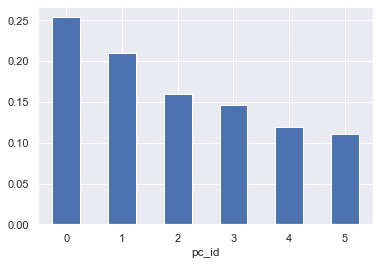

In [27]:
C.exp_var.plot.bar(rot=0);

In [28]:
L = pd.DataFrame(v, index=COV.index)
L.columns = pc_ids
L = L.T.sort_index().T
L.columns.name = 'pc_id'

In [29]:
# L[2].sort_values()

In [30]:
L.sample(20).style.background_gradient(cmap='GnBu', high=.5)

pc_id,0,1,2,3,4,5
term_str,,,,,,
grey,0.064667,-0.010470,0.018430,-0.062109,-0.028354,-0.035709
departure,-0.024373,0.011113,-0.007259,0.034771,-0.004269,0.041602
ready,-0.019238,-0.003226,-0.014068,0.004383,-0.000427,-0.002832
wish,-0.009631,-0.019280,-0.019715,0.013557,0.007997,-0.014526
move,0.008177,-0.005697,0.008062,-0.014040,-0.019314,-0.009590
show,0.014607,-0.010054,0.005168,-0.002005,0.003012,0.000983
light,0.017153,-0.026411,0.037493,-0.031178,-0.019919,-0.017511
present,-0.007081,-0.008525,0.037580,0.035441,0.038171,0.015557
required,-0.012576,-0.006658,0.003687,0.014361,0.010605,0.021404


In [31]:
DCM = TFIDF.dot(L)

In [32]:
DCM.sample(20).style.background_gradient(cmap='GnBu', high=.5)

## Extract Poles

In [33]:
top_n = 6 # Number of top words for each pole
for i in range(k):
    for j, pole in enumerate(['neg','pos']):
        top_terms = ' '.join(L.sort_values(i, ascending=bool(j)).head(top_n).index.to_list())
        C.loc[i, pole] = top_terms

In [34]:
C

,eig_val,exp_var,neg,pos
pc_id,,,,
0,0.038497,0.253822,people she things door machine her,captain island engineer granite vessel doctor
1,0.031759,0.209394,doctor balloon travellers lake gas country,captain island engineer granite vessel sea
2,0.024224,0.159712,moon professor earth captain surface sun,mr engineer granite island house she
3,0.022251,0.146707,mr her she captain moon professor,granite island engineer trees machine house
4,0.018089,0.119263,she her granite island moon engineer,mr captain door sir room ocean
5,0.016851,0.111103,professor mr moon granite engineer earth,captain she her land vessel doctor


# DCM Scatterplots

## PC 0 and 1

In [35]:
try:
    DOC = DOC.join(DCM)
except:
    pass

In [36]:
DOC

author                       title  \
book_id chap_id                                             
35      1          WELLS, H.G            The Time Machine   
        2          WELLS, H.G            The Time Machine   
        3          WELLS, H.G            The Time Machine   
        4          WELLS, H.G            The Time Machine   
        5          WELLS, H.G            The Time Machine   
...                       ...                         ...   
44278   24       VERNE, JULES  From the Earth to the Moon   
        25       VERNE, JULES  From the Earth to the Moon   
        26       VERNE, JULES  From the Earth to the Moon   
        27       VERNE, JULES  From the Earth to the Moon   
        28       VERNE, JULES  From the Earth to the Moon   

                                                      label  mean_tfidf  \
book_id chap_id                                                           
35      1                     WELLS, H.G-The Time Machine-1    0.000083   
        2                     WELLS, H.G-The Time Machine-2    0.000084   
        3                     WELLS, H.G-The Time Machine-3    0.000089   
        4                     WELLS, H.G-The Time Machine-4    0.000097   
        5                     WELLS, H.G-The Time Machine-5    0.000096   
...                                                     ...         ...   
44278   24       VERNE, JULES-From the Earth to the Moon-24    0.000111   
        25       VERNE, JULES-From the Earth to the Moon-25    0.000092   
        26       VERNE, JULES-From the Earth to the Moon-26    0.000100   
        27       VERNE, JULES-From the Earth to the Moon-27    0.000098   
        28       VERNE, JULES-From the Earth to the Moon-28    0.000100   

                 n_tokens         0         1         2         3         4  \
book_id chap_id                                                               
35      1            1691  0.114478  0.019887  0.076279 -0.004179 -0.007516   
        2            1339  0.209376  0.002864  0.019855 -0.121788 -0.103810   
        3            2000  0.256711  0.130516 -0.011568 -0.046213 -0.104071   
        4            2094  0.277570 -0.027477  0.109823 -0.234072 -0.098318   
        5            1665  0.267189 -0.036180  0.062285 -0.179837 -0.060342   
...                   ...       ...       ...       ...       ...       ...   
44278   24            927 -0.075642  0.011101  0.193299  0.095867  0.026813   
        25           1566 -0.119138 -0.005435  0.237833  0.133272  0.046579   
        26           1320 -0.011847  0.030844  0.112830  0.072360  0.068700   
        27            725 -0.041271  0.032715  0.132173  0.000957 -0.033231   
        28            590  0.001620  0.007999  0.241865  0.163197  0.137773   

                        5  
book_id chap_id            
35      1        0.083835  
        2        0.030510  
        3       -0.014529  
        4       -0.017344  
        5        0.017959  
...                   ...  
44278   24       0.179321  
        25       0.153627  
        26       0.083000  
        27       0.048150  
        28       0.099785  

[574 rows x 11 columns]

In [37]:
DOC.reset_index()[DOC.reset_index().book_id == 3526]

,book_id,chap_id,author,title,label,mean_tfidf,n_tokens,0,1,2,3,4,5
370,3526,1,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-1",0.000085,2253,-0.100230,0.376504,0.023518,0.120128,0.025977,-0.029713
371,3526,2,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-2",0.000074,1021,-0.081758,0.232088,0.018937,0.106317,0.034403,0.057200
372,3526,3,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-3",0.000098,2342,-0.044608,0.575136,0.019782,0.031492,0.058349,-0.013538
373,3526,4,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-4",0.000093,1617,-0.157537,0.155030,-0.019731,0.024909,0.051276,0.067545
374,3526,5,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-5",0.000090,1679,-0.178821,0.454937,-0.010797,0.043428,0.009913,0.003768
375,3526,6,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-6",0.000090,1537,-0.060853,0.571711,-0.043146,0.131248,-0.085830,0.046780
376,3526,7,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-7",0.000120,1433,-0.138885,0.439249,0.034814,0.049344,-0.056600,0.053171
377,3526,8,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-8",0.000098,1939,-0.184237,0.558560,-0.013064,0.119144,0.028312,-0.145768
378,3526,9,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-9",0.000100,1487,-0.118932,0.531825,0.135413,0.086376,0.045299,-0.031065
379,3526,10,"VERNE, JULES",Five Weeks in a Balloon,"VERNE, JULES-Five Weeks in a Balloon-10",0.000095,1551,-0.140159,0.356292,0.069053,-0.002203,-0.039121,0.036719


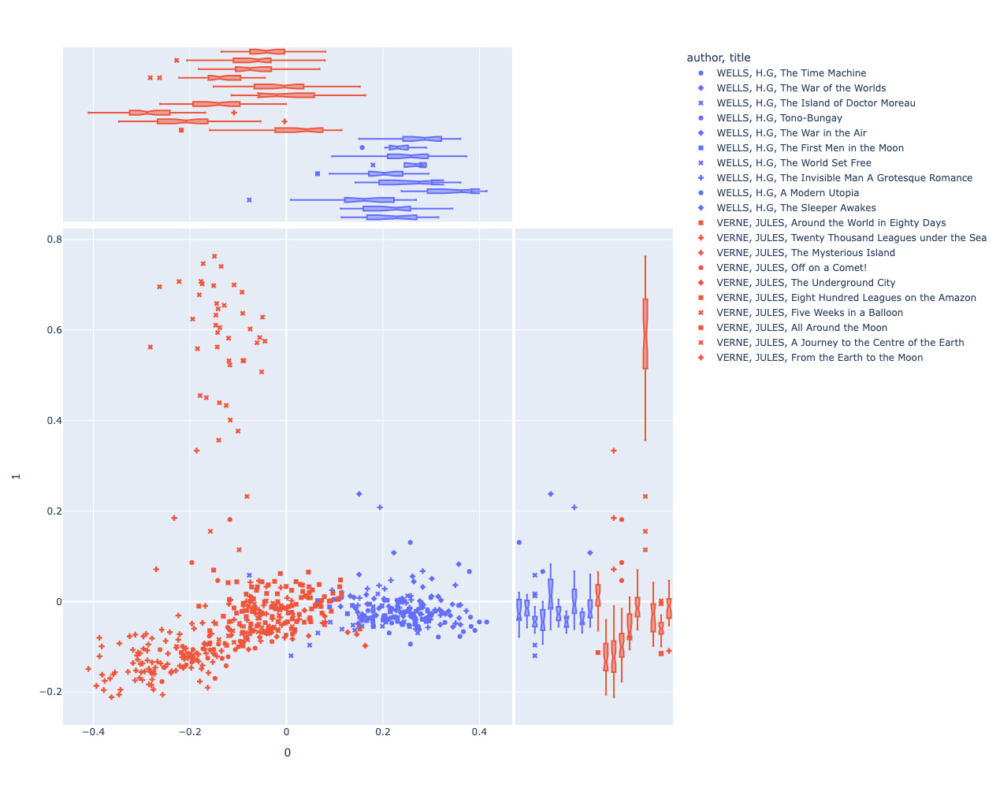

In [38]:
px.scatter(DOC, 0, 1, 
           color='author', symbol='title', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

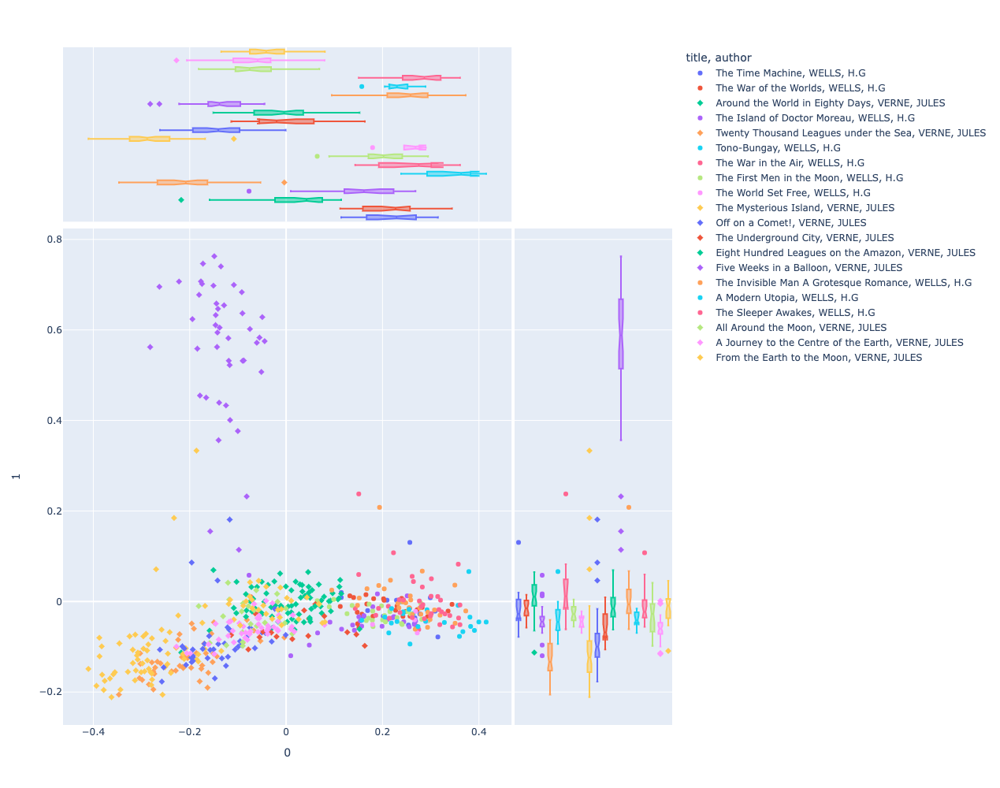

In [39]:
px.scatter(DOC, 0, 1, 
           color='title', symbol='author', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

In [40]:
C.loc[[0,1]]

,eig_val,exp_var,neg,pos
pc_id,,,,
0,0.038497,0.253822,people she things door machine her,captain island engineer granite vessel doctor
1,0.031759,0.209394,doctor balloon travellers lake gas country,captain island engineer granite vessel sea


## PC 2 and 3

In [41]:
# DOC

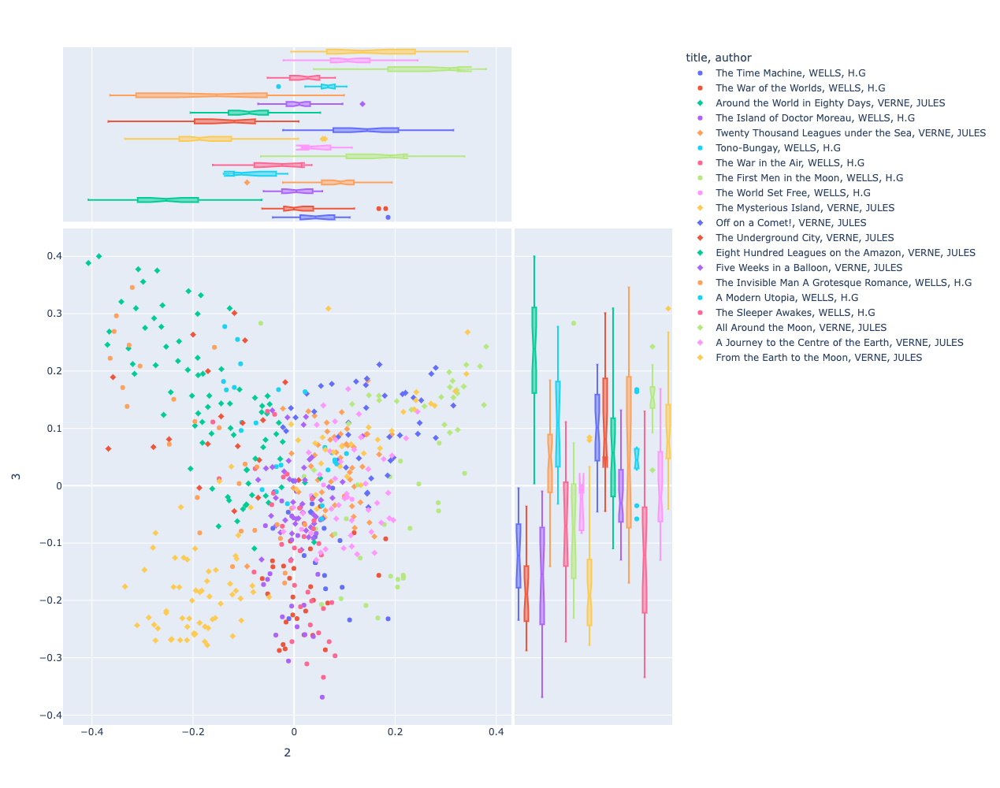

In [42]:
px.scatter(DOC, 2, 3, 
           color='title', symbol='author', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

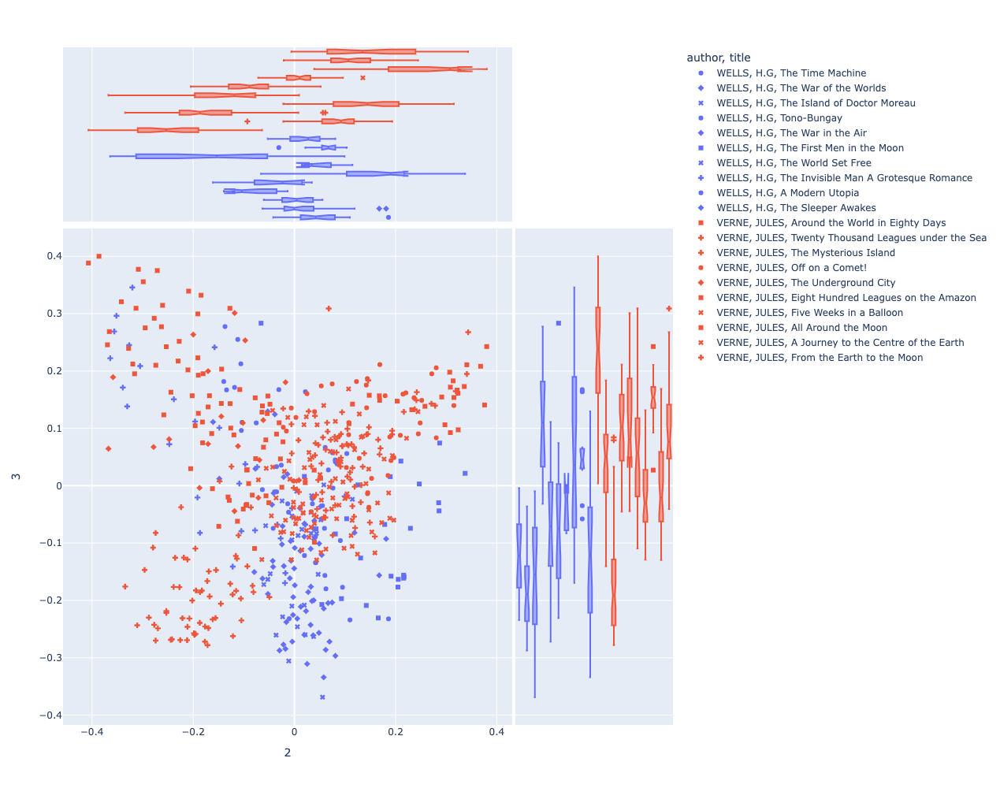

In [43]:
px.scatter(DOC, 2, 3, 
           color='author', symbol='title', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

In [44]:
C.loc[[2,3]]

,eig_val,exp_var,neg,pos
pc_id,,,,
2,0.024224,0.159712,moon professor earth captain surface sun,mr engineer granite island house she
3,0.022251,0.146707,mr her she captain moon professor,granite island engineer trees machine house


## PC 4 and 5

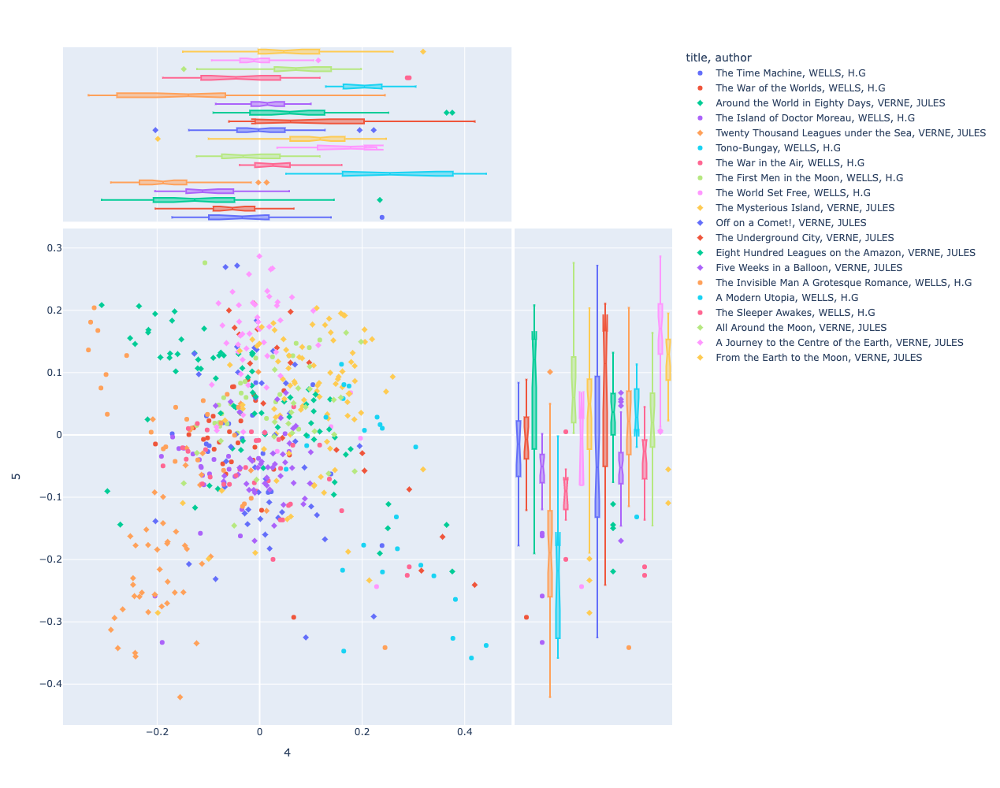

In [45]:
px.scatter(DOC, 4, 5, 
           color='title', symbol='author', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

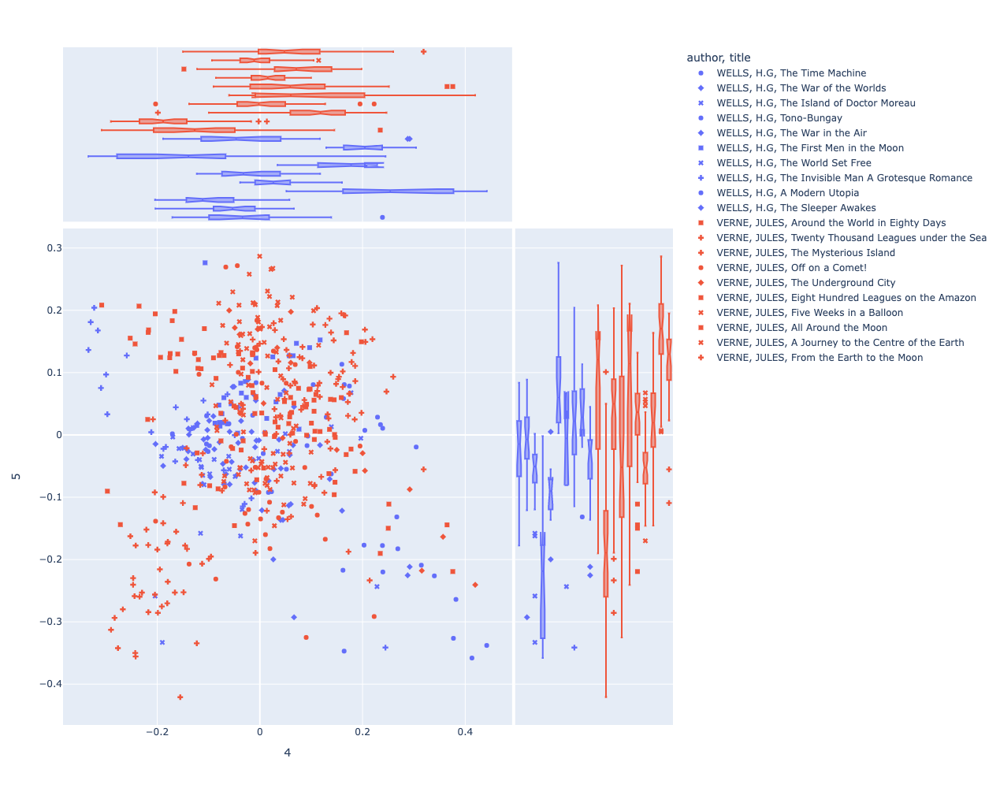

In [46]:
px.scatter(DOC, 4, 5, 
           color='author', symbol='title', 
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

# Loadings Scatterplots

In [47]:
try:
    VOCAB2 = VOCAB.join(L, how='right').reset_index()
except:
    pass

In [48]:
# VOCAB2

## PC 0 and 1

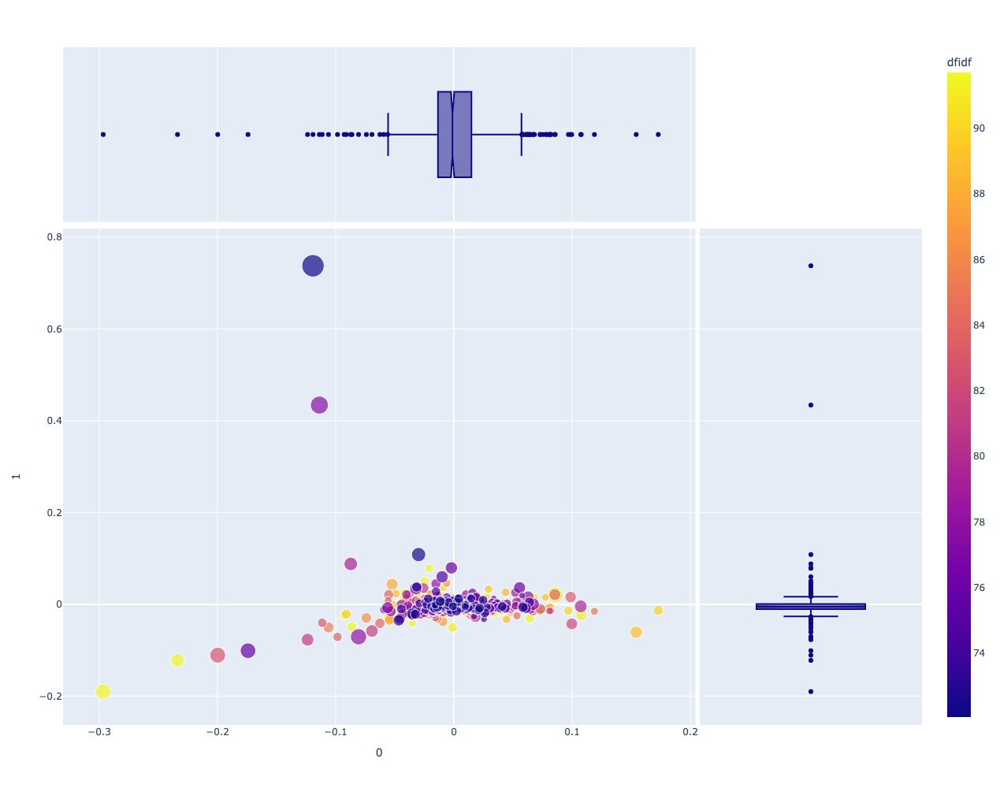

In [49]:
px.scatter(VOCAB2, 0, 1, 
           size='tfidf_mean', color='dfidf', 
           hover_name='term_str', 
           hover_data=['max_pos'], 
           marginal_x='box', marginal_y='box', 
           height=1000, width=1000)

## PC 2 and 3

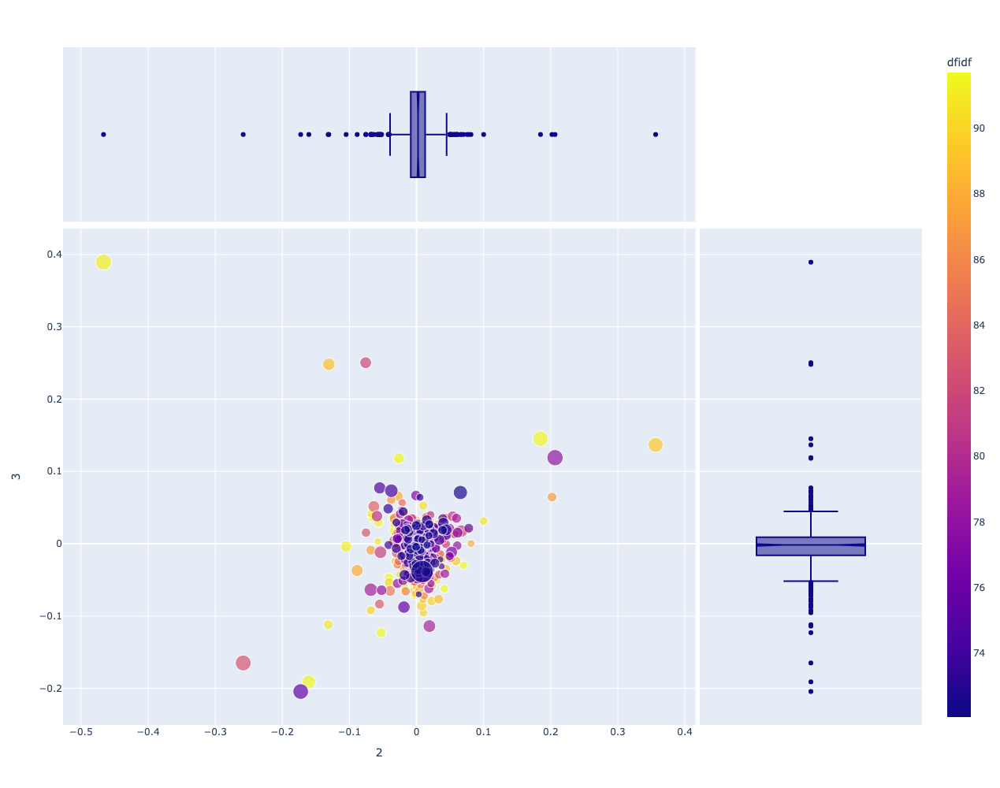

In [50]:
px.scatter(VOCAB2, 2, 3, 
           size='tfidf_mean', color='dfidf', 
           hover_name='term_str', hover_data=['max_pos'], 
           marginal_x='box', marginal_y='box', 
           height=1000, width=1000)

## PC 4 and 5 

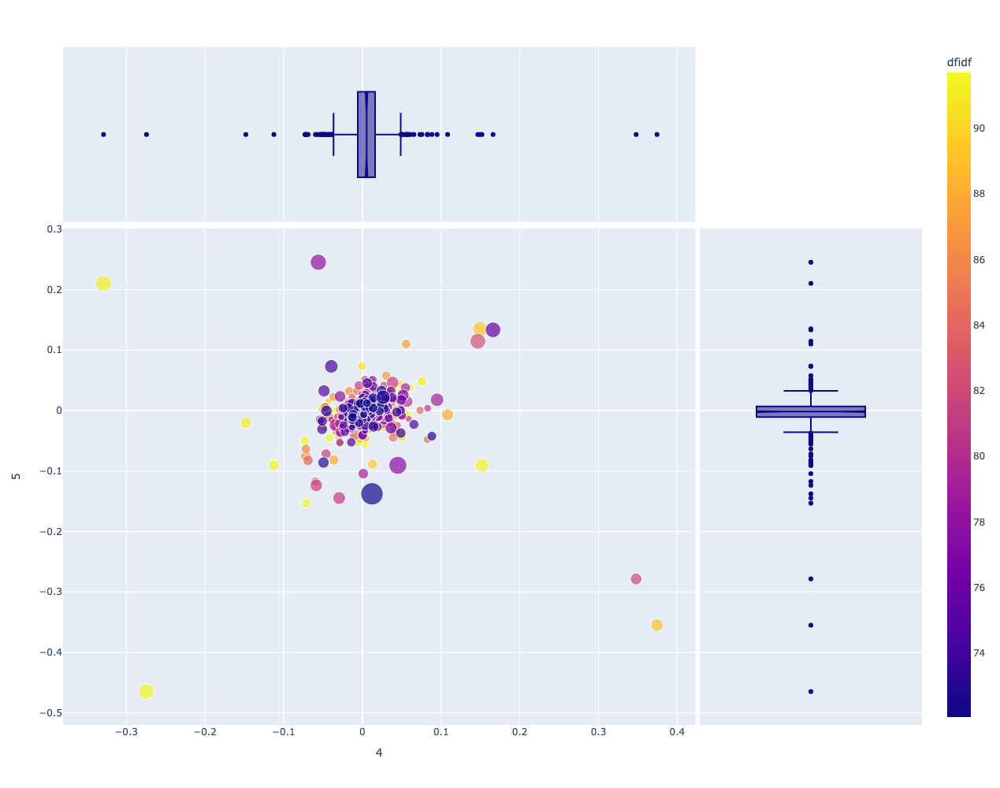

In [51]:
px.scatter(VOCAB2, 4, 5, 
           size='tfidf_mean', color='dfidf', 
           hover_name='term_str', hover_data=['max_pos'], 
           marginal_x='box', marginal_y='box', 
           height=1000, width=1000)

# Components by Books

In [52]:
os.chdir(parser_lib)
from hac2 import HAC
os.chdir(home_dir)

In [53]:
# try:
#     LIB = LIB.join(DCM.groupby('book_id').mean())
# except:
#     pass

In [54]:
#LIB.loc[list(BCM.index)]

In [55]:
BCM = DCM.groupby('book_id').mean().sort_index()
BCM.index = LIB.loc[list(BCM.index)].source_file_path

In [56]:
BCM.sort_values(0, ascending=False).style.background_gradient(cmap='GnBu', high=.5, axis=0)

pc_id,0,1,2,3,4,5
source_file_path,,,,,,
WELLS__718__Tono-Bungay.txt,0.343706,-0.036856,-0.085959,0.114399,0.252998,-0.209980
WELLS__12163__The_Sleeper_Awakes.txt,0.282877,-0.011040,0.020976,-0.128464,-0.022119,-0.047276
WELLS__780__The_War_in_the_Air.txt,0.257643,0.030183,-0.041759,-0.074345,0.038987,-0.094878
WELLS__1059__The_World_Set_Free.txt,0.255312,-0.045414,0.050946,-0.039749,0.155159,-0.038851
WELLS__5230__The_Invisible_Man_A_Grotesque_Romance.txt,0.251847,0.002981,-0.165130,0.058537,-0.152023,0.017192
WELLS__6424__A_Modern_Utopia.txt,0.231413,-0.038086,0.059379,0.051917,0.206301,0.024670
WELLS__35__The_Time_Machine.txt,0.224199,-0.014634,0.048126,-0.119296,-0.018019,-0.019377
WELLS__36__The_War_of_the_Worlds.txt,0.215849,-0.015836,0.018858,-0.184706,-0.049380,-0.009689
WELLS__1013__The_First_Men_in_the_Moon.txt,0.197682,-0.027397,0.168921,-0.073751,-0.015512,0.074936


In [57]:
C[['neg','pos']]

,neg,pos
pc_id,,
0,people she things door machine her,captain island engineer granite vessel doctor
1,doctor balloon travellers lake gas country,captain island engineer granite vessel sea
2,moon professor earth captain surface sun,mr engineer granite island house she
3,mr her she captain moon professor,granite island engineer trees machine house
4,she her granite island moon engineer,mr captain door sir room ocean
5,professor mr moon granite engineer earth,captain she her land vessel doctor


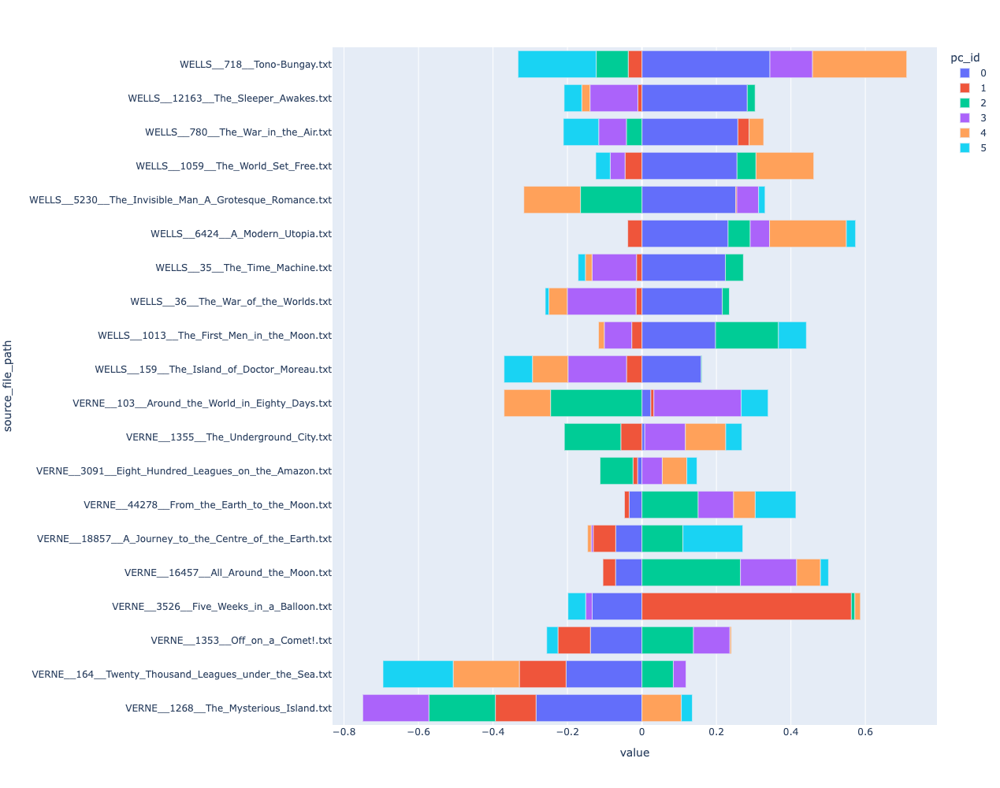

In [58]:
px.bar(BCM.sort_values(0), height=1000, orientation='h', barmode='relative')

In [59]:
print(C.loc[1, ['pos','neg']].values)

['captain island engineer granite vessel sea'
 'doctor balloon travellers lake gas country']


## Components by Authors

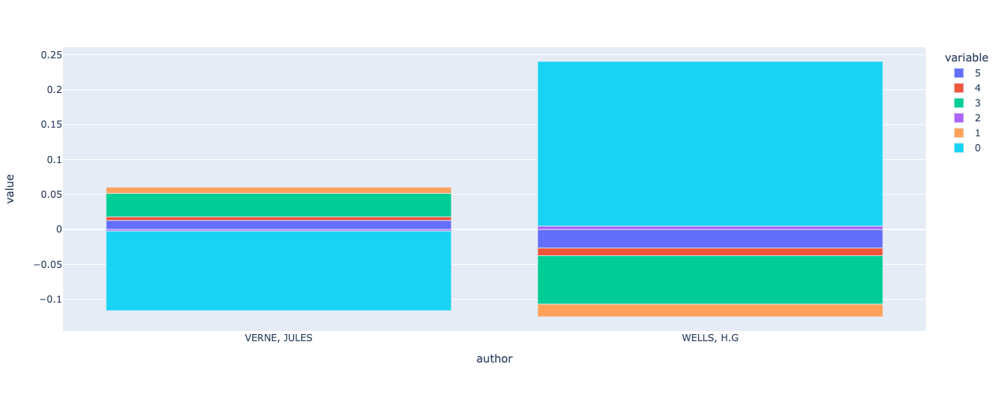

In [60]:
px.bar(DOC.groupby('author')[pc_ids].mean(), width=400, height=500)

## Components by Genre

In [61]:
#px.bar(DOC.groupby('genre')[pc_ids].mean(), width=800, height=500)

## Dendrograms

In [62]:
#import sys; sys.path.append(local_lib)
from hac2 import HAC

<Figure size 432x288 with 0 Axes>

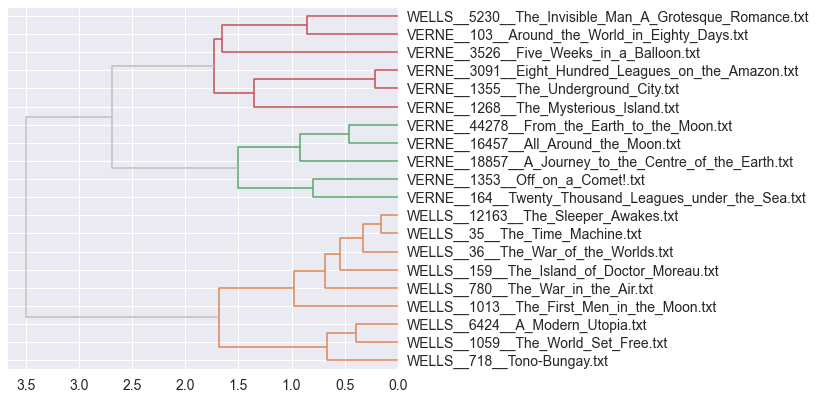

In [63]:
dend1 = HAC(BCM)
dend1.w = 7
dend1.color_thresh = 2.5
dend1.plot()

<Figure size 432x288 with 0 Axes>

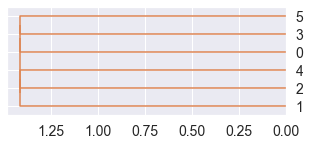

In [64]:
dend2 = HAC(DCM.T)
dend2.w = 5
dend2.color_thresh = 2
dend2.plot()

# Save

In [65]:
!ls {data_home}/output

wells-verne-BOW.csv           wells-verne-PCA_DCM.csv
wells-verne-BOW_REDUCED.csv   wells-verne-PCA_THETA.csv
wells-verne-CORPUS.csv        wells-verne-SIGS.csv
wells-verne-CORPUS2.csv       wells-verne-TFIDF.csv
wells-verne-DTCM.csv          wells-verne-TFIDF_REDUCED.csv
wells-verne-LIB.csv           wells-verne-VOCAB.csv
wells-verne-LIB2.csv          wells-verne-VOCAB2.csv
wells-verne-PCA_COMPS.csv


In [66]:
LIB.to_csv(f"{data_home}/output/{data_prefix}-LIB2.csv")

In [67]:
C.to_csv(f"{data_home}/output/{data_prefix}-PCA_COMPS.csv")
L.to_csv(f"{data_home}/output/{data_prefix}-PCA_THETA.csv")
DCM.to_csv(f"{data_home}/output/{data_prefix}-PCA_DCM.csv")